# Deep Learning: A Simple Example

- Let's get back to the Name Gender Classifier.

![](../images/keras-workflow.png)

## Prepare Data

In [1]:
import numpy as np
import nltk
from nltk.corpus import names
import random

In [2]:
labeled_names = ([(name, 1) for name in names.words('male.txt')] +
                 [(name, 0) for name in names.words('female.txt')])
random.shuffle(labeled_names)

## Train-Test Split

In [3]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(labeled_names, test_size = 0.2, random_state=42)
print(len(train_set), len(test_set))

6355 1589


In [4]:
import tensorflow as tf
import tensorflow.keras as keras
from keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from keras.utils import to_categorical, plot_model
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM, RNN, GRU
from keras.layers import Embedding
from keras.layers import SpatialDropout1D

In [5]:
names = [n for (n, l) in train_set]
labels = [l for (n, l) in train_set] 

In [6]:
len(names)

6355

## Tokenizer

- By default, the token index 0 is reserved for padding token.
- If `oov_token` is specified, it is default to index 1.
- Specify `num_words` for tokenizer to include only top N words in the model
- Tokenizer will automatically remove puntuations.
- Tokenizer use whitespace as word delimiter.
- If every character is treated as a token, specify `char_level=True`.

In [7]:
tokenizer = Tokenizer(char_level=True)
tokenizer.fit_on_texts(names)

## Prepare Input and Output Tensors

- Like in feature-based machine translation, a computational model only accepts numeric values. It is necessary to convert raw text to numeric tensor for neural network.
- After we create the Tokenizer, we use the Tokenizer to perform text vectorization, i.e., converting texts into tensors.
- In deep learning, words or characters are automatically converted into numeric representations.
- In other words, the feature engineering step is fully automatic.

### Two Ways of Text Vectorization

- Texts to Sequences: **Integer encoding** of tokens in texts and learn token **embeddings**
- Texts to Matrix: **One-hot encoding** of texts (similar to bag-of-words model)


## Method 1: Text to Sequences

### From Texts and Sequences

- Text to Sequences
- Padding to uniform lengths for each text

In [8]:
names_ints = tokenizer.texts_to_sequences(names)

In [9]:
print(names[:10])
print(names_ints[:10])
print(labels[:10])

['Bette-Ann', 'Ebeneser', 'Eimile', 'Toby', 'Gavrielle', 'Meris', 'Audrey', 'Hermine', 'Corilla', 'Krystyna']
[[15, 2, 8, 8, 2, 27, 1, 4, 4], [2, 15, 2, 4, 2, 9, 2, 5], [2, 3, 11, 3, 6, 2], [8, 7, 15, 13], [17, 1, 19, 5, 3, 2, 6, 6, 2], [11, 2, 5, 3, 9], [1, 16, 10, 5, 2, 13], [12, 2, 5, 11, 3, 4, 2], [14, 7, 5, 3, 6, 6, 1], [18, 5, 13, 9, 8, 13, 4, 1]]
[0, 1, 0, 1, 0, 0, 0, 0, 0, 0]


### Vocabulary

In [10]:
# determine the vocabulary size
vocab_size = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocab_size)

Vocabulary Size: 30


In [11]:
tokenizer.word_index

{'a': 1,
 'e': 2,
 'i': 3,
 'n': 4,
 'r': 5,
 'l': 6,
 'o': 7,
 't': 8,
 's': 9,
 'd': 10,
 'm': 11,
 'h': 12,
 'y': 13,
 'c': 14,
 'b': 15,
 'u': 16,
 'g': 17,
 'k': 18,
 'v': 19,
 'j': 20,
 'f': 21,
 'p': 22,
 'w': 23,
 'z': 24,
 'x': 25,
 'q': 26,
 '-': 27,
 ' ': 28,
 "'": 29}

### Padding

- When padding the all texts into uniform lengths, consider whether to Pre-padding or removing values from the beginning of the sequence (i.e., `pre`) or the other way (`post`).
-  Check `padding` and `truncating` parameters in `pad_sequences`

Helen-Elizabeth


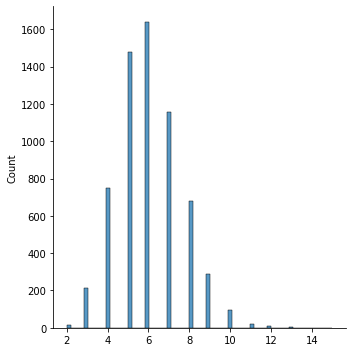

In [12]:
names_lens=[len(n) for n in names_ints]
names_lens
import seaborn as sns
sns.displot(names_lens)
print(names[np.argmax(names_lens)]) # longest name

In [13]:
max_len = names_lens[np.argmax(names_lens)]
max_len

15

In [14]:
names_ints_pad = sequence.pad_sequences(names_ints, maxlen = max_len)
names_ints_pad[:10]

array([[ 0,  0,  0,  0,  0,  0, 15,  2,  8,  8,  2, 27,  1,  4,  4],
       [ 0,  0,  0,  0,  0,  0,  0,  2, 15,  2,  4,  2,  9,  2,  5],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  2,  3, 11,  3,  6,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  8,  7, 15, 13],
       [ 0,  0,  0,  0,  0,  0, 17,  1, 19,  5,  3,  2,  6,  6,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 11,  2,  5,  3,  9],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  1, 16, 10,  5,  2, 13],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 12,  2,  5, 11,  3,  4,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 14,  7,  5,  3,  6,  6,  1],
       [ 0,  0,  0,  0,  0,  0,  0, 18,  5, 13,  9,  8, 13,  4,  1]],
      dtype=int32)

### Define X and Y

In [15]:
X_train = np.array(names_ints_pad).astype('int32')
y_train = np.array(labels)

X_test = np.array(sequence.pad_sequences(
    tokenizer.texts_to_sequences([n for (n,l) in test_set]),
    maxlen = max_len)).astype('int32')
y_test = np.array([l for (n,l) in test_set])

X_test_texts = [n for (n,l) in test_set]

In [16]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(6355, 15)
(6355,)
(1589, 15)
(1589,)


## Method 2: Text to Matrix

### One-Hot Encoding

- Text to Matrix (to create bag-of-word representation of each text)
- Choose modes: binary, count, or tfidf

In [17]:
names_matrix = tokenizer.texts_to_matrix(names, mode="binary")

In [18]:
names[2]

'Eimile'

- `names_matrix` in fact is a bag-of-characters representation of a name text.

In [19]:
import pandas as pd
pd.DataFrame(names_matrix[2,1:], 
             columns=["ONE-HOT"],
             index=list(tokenizer.word_index.keys()))

,ONE-HOT
a,0.0
e,1.0
i,1.0
n,0.0
r,0.0
l,1.0
o,0.0
t,0.0
s,0.0
d,0.0


### Define X and Y

In [20]:
X_train2 = np.array(names_matrix).astype('int32')
y_train2 = np.array(labels)

X_test2 = tokenizer.texts_to_matrix([n for (n,l) in test_set], mode="binary").astype('int32')
y_test2 = np.array([l for (n,l) in test_set])

X_test2_texts = [n for (n,l) in test_set]

In [21]:
print(X_train2.shape)
print(y_train2.shape)
print(X_test2.shape)
print(y_test2.shape)

(6355, 30)
(6355,)
(1589, 30)
(1589,)


## Model Definition

- After we have defined our input and output tensors (X and y), we can define the architecture of our neural network model.
- For the two ways of name vectorized representations, we try two different network structures.
    - Text to Sequences: Embedding + RNN
    - Text to Matrix: Fully connected Dense Layers

In [22]:
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
# Plotting results
def plot1(history):

    matplotlib.rcParams['figure.dpi'] = 100
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc)+1)
    ## Accuracy plot
    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    ## Loss plot
    plt.figure()

    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()

    
def plot2(history):
    pd.DataFrame(history.history).plot(figsize=(8,5))
    plt.grid(True)
    #plt.gca().set_ylim(0,1)
    plt.show()

### Model 1: Fully Connected Dense Layers

- Two fully-connected dense layers with the Text-to-Matrix inputs

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.002.jpeg)

In [23]:
from keras import layers
model1 = keras.Sequential()
model1.add(keras.Input(shape=(vocab_size,), name="one_hot_input"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_1"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_2"))
model1.add(layers.Dense(1, activation="sigmoid", name="output"))

model1.compile(
    loss=keras.losses.BinaryCrossentropy(),
    optimizer=keras.optimizers.Adam(lr=0.001),
    metrics=["accuracy"]
)


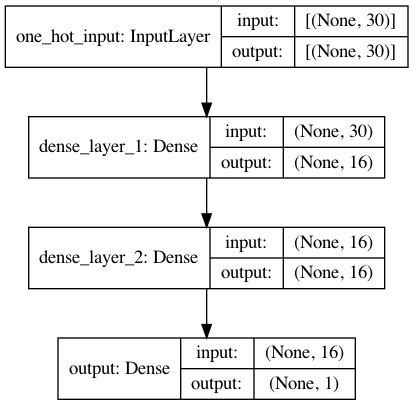

In [24]:
plot_model(model1, show_shapes=True)

### A few hyperparameters for network training

- Batch size
- Epoch
- Validation Split Ratio

In [25]:
BATCH_SIZE=128
EPOCHS=20
VALIDATION_SPLIT=0.2

In [26]:
history1 = model1.fit(X_train2, y_train2, 
                    batch_size=BATCH_SIZE, 
                    epochs=EPOCHS, verbose=2,
                   validation_split = VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6472 - accuracy: 0.6334 - val_loss: 0.6420 - val_accuracy: 0.6255
Epoch 2/20
40/40 - 0s - loss: 0.6316 - accuracy: 0.6341 - val_loss: 0.6317 - val_accuracy: 0.6294
Epoch 3/20
40/40 - 0s - loss: 0.6224 - accuracy: 0.6418 - val_loss: 0.6242 - val_accuracy: 0.6672
Epoch 4/20
40/40 - 0s - loss: 0.6134 - accuracy: 0.6593 - val_loss: 0.6178 - val_accuracy: 0.6766
Epoch 5/20
40/40 - 0s - loss: 0.6054 - accuracy: 0.6743 - val_loss: 0.6111 - val_accuracy: 0.6806
Epoch 6/20
40/40 - 0s - loss: 0.5977 - accuracy: 0.6804 - val_loss: 0.6050 - val_accuracy: 0.6845
Epoch 7/20
40/40 - 0s - loss: 0.5906 - accuracy: 0.6902 - val_loss: 0.5991 - val_accuracy: 0.6900
Epoch 8/20
40/40 - 0s - loss: 0.5844 - accuracy: 0.6932 - val_loss: 0.5944 - val_accuracy: 0.6947
Epoch 9/20
40/40 - 0s - loss: 0.5786 - accuracy: 0.6985 - val_loss: 0.5907 - val_accuracy: 0.6939
Epoch 10/20
40/40 - 0s - loss: 0.5735 - accuracy: 0.7028 - val_loss: 0.5869 - val_accuracy: 0.6924
Epoch 11/20
40/40 -

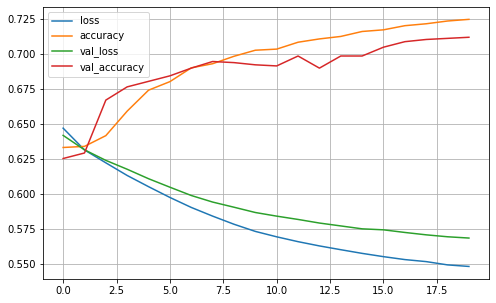

In [27]:
plot2(history1)

In [28]:
model1.evaluate(X_test2, y_test2, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.5786 - accuracy: 0.7067


[0.5785751938819885, 0.7067338228225708]

### Model 2: Embedding + RNN

- One Embedding Layer + One RNN Layer 
- With Text-to-Sequence inputs

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.004.jpeg)

In [29]:
EMBEDDING_DIM = 128
model2 = Sequential()
model2.add(Embedding(input_dim=vocab_size, 
                     output_dim=EMBEDDING_DIM, 
                     input_length=max_len, 
                     mask_zero=True))
model2.add(layers.SimpleRNN(16, activation="relu", name="lstm_layer"))
model2.add(Dense(16, activation="relu", name="dense_layer"))
model2.add(Dense(1, activation="sigmoid", name="output"))

model2.compile(
    loss=keras.losses.BinaryCrossentropy(),
    optimizer=keras.optimizers.Adam(lr=0.001),
    metrics=["accuracy"]
)

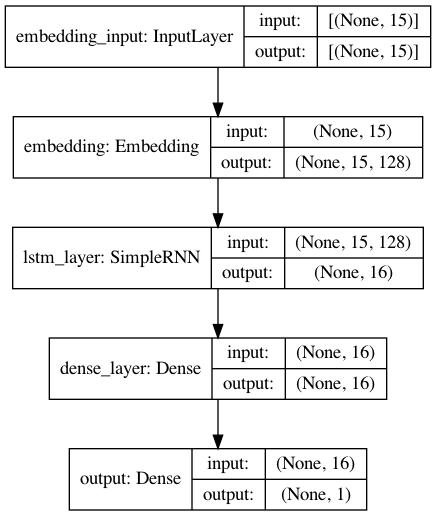

In [30]:
plot_model(model2, show_shapes=True)

In [31]:
history2 = model2.fit(X_train, y_train, 
                    batch_size=BATCH_SIZE, 
                    epochs=EPOCHS, verbose=2,
                    validation_split = VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6051 - accuracy: 0.6357 - val_loss: 0.5358 - val_accuracy: 0.6483
Epoch 2/20
40/40 - 0s - loss: 0.4896 - accuracy: 0.7433 - val_loss: 0.4548 - val_accuracy: 0.7946
Epoch 3/20
40/40 - 0s - loss: 0.4399 - accuracy: 0.7878 - val_loss: 0.4264 - val_accuracy: 0.8017
Epoch 4/20
40/40 - 0s - loss: 0.4208 - accuracy: 0.7988 - val_loss: 0.4188 - val_accuracy: 0.8041
Epoch 5/20
40/40 - 0s - loss: 0.4088 - accuracy: 0.8084 - val_loss: 0.4108 - val_accuracy: 0.8175
Epoch 6/20
40/40 - 0s - loss: 0.3995 - accuracy: 0.8129 - val_loss: 0.4081 - val_accuracy: 0.8033
Epoch 7/20
40/40 - 0s - loss: 0.3937 - accuracy: 0.8153 - val_loss: 0.4055 - val_accuracy: 0.8104
Epoch 8/20
40/40 - 0s - loss: 0.3893 - accuracy: 0.8157 - val_loss: 0.4069 - val_accuracy: 0.8072
Epoch 9/20
40/40 - 0s - loss: 0.3838 - accuracy: 0.8190 - val_loss: 0.4063 - val_accuracy: 0.8096
Epoch 10/20
40/40 - 0s - loss: 0.3805 - accuracy: 0.8200 - val_loss: 0.4066 - val_accuracy: 0.8112
Epoch 11/20
40/40 -

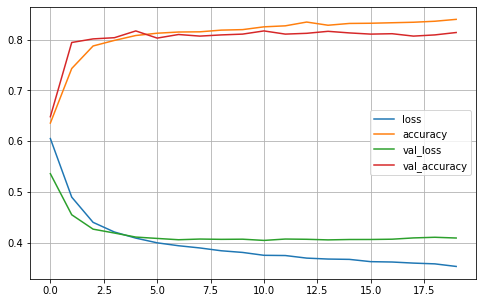

In [32]:
plot2(history2)

In [33]:
model2.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4067 - accuracy: 0.8093


[0.40674683451652527, 0.8093140125274658]

### Model 3: Regularization and Dropout

- Previous two examples clearly show overfitting of the models because the model performance on the validation set starts to stall after the first few epochs.
- We can implement regularization and dropouts in our network definition to avoid overfitting.

In [34]:
EMBEDDING_DIM = 128
model3 = Sequential()
model3.add(Embedding(input_dim=vocab_size, 
                     output_dim=EMBEDDING_DIM, 
                     input_length=max_len, 
                     mask_zero=True))
model3.add(layers.SimpleRNN(16, activation="relu", name="lstm_layer", dropout=0.2, recurrent_dropout=0.2))
model3.add(Dense(16, activation="relu", name="dense_layer"))
model3.add(Dense(1, activation="sigmoid", name="output"))

model3.compile(
    loss=keras.losses.BinaryCrossentropy(),
    optimizer=keras.optimizers.Adam(lr=0.001),
    metrics=["accuracy"]
)

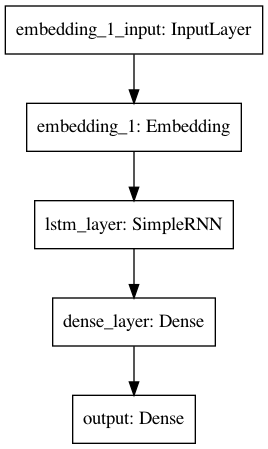

In [35]:
plot_model(model3)

In [36]:
history3 = model3.fit(X_train, y_train, 
                    batch_size=BATCH_SIZE, 
                    epochs=EPOCHS, verbose=2,
                    validation_split = VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6245 - accuracy: 0.6442 - val_loss: 0.5580 - val_accuracy: 0.6593
Epoch 2/20
40/40 - 0s - loss: 0.5194 - accuracy: 0.7292 - val_loss: 0.4733 - val_accuracy: 0.7773
Epoch 3/20
40/40 - 0s - loss: 0.4694 - accuracy: 0.7679 - val_loss: 0.4456 - val_accuracy: 0.7876
Epoch 4/20
40/40 - 0s - loss: 0.4485 - accuracy: 0.7805 - val_loss: 0.4303 - val_accuracy: 0.7970
Epoch 5/20
40/40 - 0s - loss: 0.4497 - accuracy: 0.7769 - val_loss: 0.4278 - val_accuracy: 0.8033
Epoch 6/20
40/40 - 0s - loss: 0.4388 - accuracy: 0.7852 - val_loss: 0.4223 - val_accuracy: 0.7970
Epoch 7/20
40/40 - 0s - loss: 0.4366 - accuracy: 0.7862 - val_loss: 0.4195 - val_accuracy: 0.8017
Epoch 8/20
40/40 - 0s - loss: 0.4333 - accuracy: 0.7846 - val_loss: 0.4231 - val_accuracy: 0.7962
Epoch 9/20
40/40 - 0s - loss: 0.4294 - accuracy: 0.7852 - val_loss: 0.4178 - val_accuracy: 0.7994
Epoch 10/20
40/40 - 0s - loss: 0.4307 - accuracy: 0.7897 - val_loss: 0.4135 - val_accuracy: 0.8009
Epoch 11/20
40/40 -

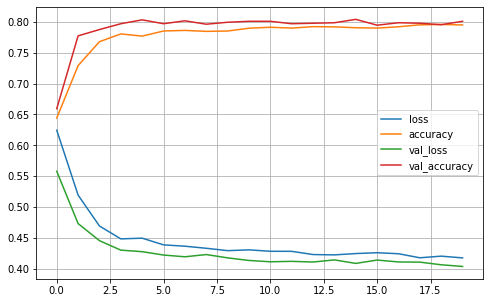

In [37]:
plot2(history3)

In [38]:
model3.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4232 - accuracy: 0.7904


[0.4231923818588257, 0.7904342412948608]

### Model 4: Improve the Models

- In addition to regularization and dropouts, we can further improve the model by increasing the model complexity.
- In particular, we can increase the depths and widths of the network layers.
- Let's try stack two RNN layers.

In [39]:
EMBEDDING_DIM = 128
model4 = Sequential()
model4.add(Embedding(input_dim=vocab_size, 
                     output_dim=EMBEDDING_DIM, 
                     input_length=max_len, 
                     mask_zero=True))
model4.add(layers.SimpleRNN(16, activation="relu", name="lstm_layer_1", 
                            dropout=0.2, recurrent_dropout=0.2, return_sequences=True))
model4.add(layers.SimpleRNN(16, activation="relu", name="lstm_layer_2", 
                            dropout=0.2, recurrent_dropout=0.2))
model4.add(Dense(1, activation="sigmoid", name="output"))
model4.compile(
    loss=keras.losses.BinaryCrossentropy(),
    optimizer=keras.optimizers.Adam(lr=0.001),
    metrics=["accuracy"]
)

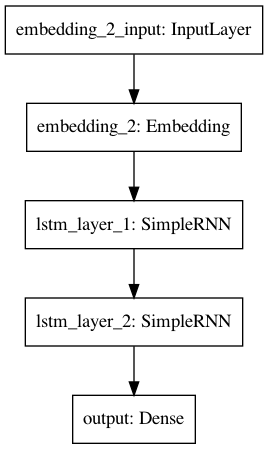

In [40]:
plot_model(model4)

In [41]:
history4 = model4.fit(X_train, y_train, 
                    batch_size=BATCH_SIZE, 
                    epochs=EPOCHS, verbose=2,
                    validation_split = VALIDATION_SPLIT)

Epoch 1/20
40/40 - 3s - loss: 0.6232 - accuracy: 0.6339 - val_loss: 0.5616 - val_accuracy: 0.6381
Epoch 2/20
40/40 - 0s - loss: 0.5431 - accuracy: 0.6796 - val_loss: 0.5015 - val_accuracy: 0.7553
Epoch 3/20
40/40 - 1s - loss: 0.5052 - accuracy: 0.7347 - val_loss: 0.4751 - val_accuracy: 0.7640
Epoch 4/20
40/40 - 0s - loss: 0.4844 - accuracy: 0.7606 - val_loss: 0.4592 - val_accuracy: 0.7797
Epoch 5/20
40/40 - 0s - loss: 0.4755 - accuracy: 0.7673 - val_loss: 0.4461 - val_accuracy: 0.7891
Epoch 6/20
40/40 - 0s - loss: 0.4626 - accuracy: 0.7722 - val_loss: 0.4347 - val_accuracy: 0.7923
Epoch 7/20
40/40 - 0s - loss: 0.4550 - accuracy: 0.7785 - val_loss: 0.4313 - val_accuracy: 0.7939
Epoch 8/20
40/40 - 0s - loss: 0.4579 - accuracy: 0.7771 - val_loss: 0.4308 - val_accuracy: 0.7923
Epoch 9/20
40/40 - 0s - loss: 0.4464 - accuracy: 0.7807 - val_loss: 0.4216 - val_accuracy: 0.8025
Epoch 10/20
40/40 - 0s - loss: 0.4469 - accuracy: 0.7781 - val_loss: 0.4219 - val_accuracy: 0.7923
Epoch 11/20
40/40 -

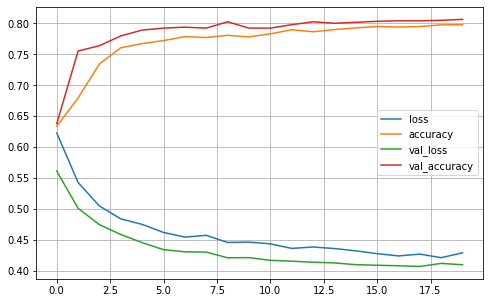

In [42]:
plot2(history4)

In [43]:
model4.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4212 - accuracy: 0.8068


[0.42124617099761963, 0.8067967295646667]

### Model 5: Bidirectional

- Now let's try the more sophisticated RNN, LSTM, and with birectional computing.
- And add more nodes to the LSTM layer.

In [44]:
EMBEDDING_DIM = 128
model5 = Sequential()
model5.add(Embedding(input_dim=vocab_size, 
                     output_dim=EMBEDDING_DIM, 
                     input_length=max_len, 
                     mask_zero=True))
model5.add(layers.Bidirectional(LSTM(32, activation="relu", name="lstm_layer", dropout=0.2, recurrent_dropout=0.2)))
model5.add(Dense(1, activation="sigmoid", name="output"))

model5.compile(
    loss=keras.losses.BinaryCrossentropy(),
    optimizer=keras.optimizers.Adam(lr=0.001),
    metrics=["accuracy"]
)

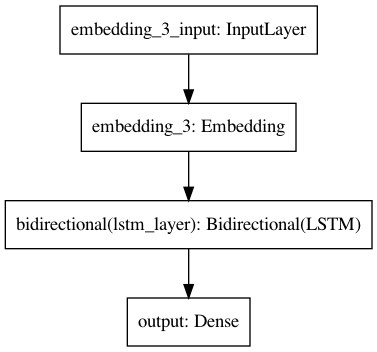

In [45]:
plot_model(model5)

In [46]:
history5 = model5.fit(X_train, y_train, 
                    batch_size=BATCH_SIZE, 
                    epochs=EPOCHS, verbose=2,
                    validation_split = VALIDATION_SPLIT)

Epoch 1/20
40/40 - 8s - loss: 0.6625 - accuracy: 0.6184 - val_loss: 0.6262 - val_accuracy: 0.6255
Epoch 2/20
40/40 - 1s - loss: 0.5757 - accuracy: 0.6762 - val_loss: 0.4984 - val_accuracy: 0.7569
Epoch 3/20
40/40 - 1s - loss: 0.4699 - accuracy: 0.7764 - val_loss: 0.4438 - val_accuracy: 0.7939
Epoch 4/20
40/40 - 2s - loss: 0.4414 - accuracy: 0.7870 - val_loss: 0.4359 - val_accuracy: 0.7907
Epoch 5/20
40/40 - 2s - loss: 0.4330 - accuracy: 0.7903 - val_loss: 0.4289 - val_accuracy: 0.7970
Epoch 6/20
40/40 - 1s - loss: 0.4263 - accuracy: 0.7980 - val_loss: 0.4218 - val_accuracy: 0.8088
Epoch 7/20
40/40 - 1s - loss: 0.4208 - accuracy: 0.7994 - val_loss: 0.4177 - val_accuracy: 0.8120
Epoch 8/20
40/40 - 1s - loss: 0.4124 - accuracy: 0.8007 - val_loss: 0.4131 - val_accuracy: 0.8096
Epoch 9/20
40/40 - 1s - loss: 0.4081 - accuracy: 0.8061 - val_loss: 0.4099 - val_accuracy: 0.8120
Epoch 10/20
40/40 - 1s - loss: 0.4050 - accuracy: 0.8082 - val_loss: 0.4100 - val_accuracy: 0.8127
Epoch 11/20
40/40 -

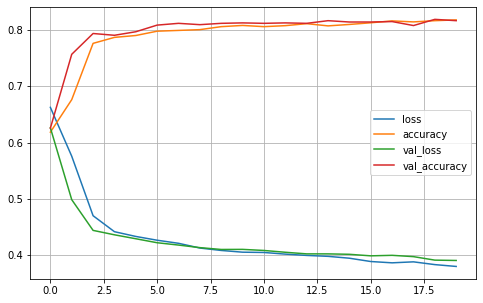

In [47]:
plot2(history5)

In [48]:
model5.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4044 - accuracy: 0.7992


[0.40442442893981934, 0.7992448210716248]

## Check Embeddings

- Compared to one-hot encodings of characters, embeddings may include more information relating to the characteristics of the characters.
- We can extract the embedding layer and apply dimensional reduction techniques (i.e., TSNE) to see how embeddings capture the relationships in-between characters.

In [49]:
X_test[10]

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  1, 12,  1,  5,  7,  4],
      dtype=int32)

In [50]:
ind2char = tokenizer.index_word
[ind2char.get(i) for i in X_test[10] if ind2char.get(i)!= None ]

['a', 'h', 'a', 'r', 'o', 'n']

In [51]:
tokenizer.texts_to_sequences('Alvin')

[[1], [6], [19], [3], [4]]

In [52]:
char_vectors = model5.layers[0].get_weights()[0]
char_vectors.shape

(30, 128)

In [53]:
labels = [char for (ind, char) in tokenizer.index_word.items()]
labels.insert(0,None)
labels

[None,
 'a',
 'e',
 'i',
 'n',
 'r',
 'l',
 'o',
 't',
 's',
 'd',
 'm',
 'h',
 'y',
 'c',
 'b',
 'u',
 'g',
 'k',
 'v',
 'j',
 'f',
 'p',
 'w',
 'z',
 'x',
 'q',
 '-',
 ' ',
 "'"]

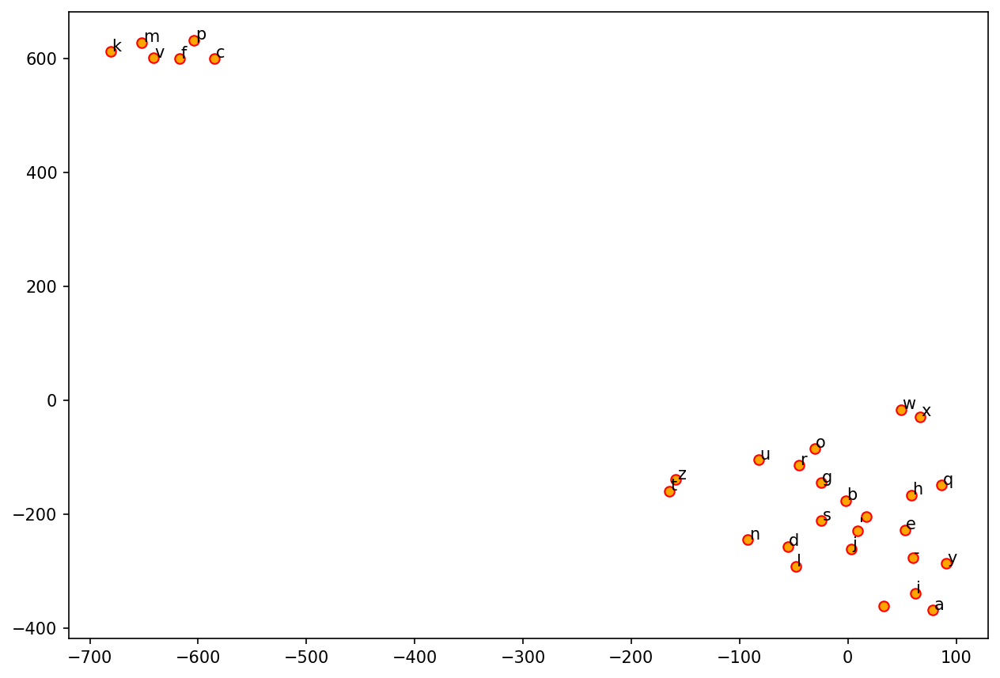

In [87]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=0, n_iter=5000, perplexity=3)
np.set_printoptions(suppress=True)
T = tsne.fit_transform(char_vectors)
labels = labels

plt.figure(figsize=(10, 7), dpi=150)
plt.scatter(T[:, 0], T[:, 1], c='orange', edgecolors='r')
for label, x, y in zip(labels, T[:, 0], T[:, 1]):
    plt.annotate(label, xy=(x+1, y+1), xytext=(0, 0), textcoords='offset points')

## Issues of Word/Character Representations

- One-hot encoding does not indicate semantic relationships between characters.
- For deep learning NLP, it is preferred to convert one-hot encodings of words/characters into embeddings, which are argued to include more semantic information of the tokens.
- Now the question is how to train and create better word embeddings. We will come back to this issue later.

## Hyperparameter Tuning

:::{note}

Please install keras tuner module in your current conda:
```
pip install -U keras-tuner
```

:::

- Like feature-based ML methods, neural networks also come with many hyperparameters, which require default values.
- Typical hyperparameters include:
    - Number of nodes for the layer
    - Learning Rates
- We can utilize the module, [`keras-tuner`](https://keras-team.github.io/keras-tuner/documentation/tuners/), to fine-tune the hyperparameters.

- Steps for Keras Tuner
    - First, wrap the model definition in a function, which takes a single `hp` argument. 
    - Inside this function, replace any value we want to tune with a call to hyperparameter sampling methods, e.g. `hp.Int()` or `hp.Choice()`. The function should return a compiled model.
    - Next, instantiate a tuner object specifying your optimization objective and other search parameters.
    - Finally, start the search with the `search()` method, which takes the same arguments as `Model.fit()` in keras.
    - When search is over, we can retrieve the best model and a summary of the results from the `tunner`.


In [55]:
import kerastuner

In [56]:
## Wrap model definition in a function
## and specify the parameters needed for tuning
# def build_model(hp):
#     model1 = keras.Sequential()
#     model1.add(keras.Input(shape=(max_len,)))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_1"))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_2"))
#     model1.add(layers.Dense(2, activation="softmax", name="output"))
#     model1.compile(
#         optimizer=keras.optimizers.Adam(
#             hp.Choice('learning_rate',
#                       values=[1e-2, 1e-3, 1e-4])),
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy'])
#     return model1

def build_model(hp):
    m= Sequential()
    m.add(Embedding(input_dim=vocab_size, 
                    output_dim=hp.Int('output_dim', min_value=32, max_value=128, step=32), 
                    input_length=max_len, 
                    mask_zero=True))
    m.add(layers.Bidirectional(LSTM(
        hp.Int('units', min_value=16, max_value=64, step=16),
        activation="relu", 
        dropout=0.2, 
        recurrent_dropout=0.2)))
    m.add(Dense(1, activation="sigmoid", name="output"))

    m.compile(
        loss=keras.losses.BinaryCrossentropy(),
        optimizer=keras.optimizers.Adam(lr=0.001),
        metrics=["accuracy"]
    )
    return m

In [57]:
## This is to clean up the temp dir from the tuner
## Every time we re-start the tunner, it's better to keep the temp dir clean

import os
import shutil

if os.path.isdir('my_dir'):
    shutil.rmtree('my_dir')
    

- The `max_trials` variable represents the number of hyperparameter combinations that will be tested by the tuner.
- The `execution_per_trial` variable is the number of models that should be built and fit for each trial for robustness purposes.

In [58]:
## Instantiate the tunner

tuner = kerastuner.tuners.RandomSearch(
  build_model,
  objective='val_accuracy',
  max_trials=10,
  executions_per_trial=2,
  directory='my_dir')

In [59]:
## Check the tuner's search space
tuner.search_space_summary()

Search space summary
Default search space size: 2
output_dim (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 32, 'sampling': None}
units (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 64, 'step': 16, 'sampling': None}


In [60]:
%%time
## Start tuning with the tuner
tuner.search(X_train, y_train, validation_split=0.2, batch_size=128)

Trial 10 Complete [00h 00m 15s]
val_accuracy: 0.6258851289749146

Best val_accuracy So Far: 0.6266719102859497
Total elapsed time: 00h 02m 32s
INFO:tensorflow:Oracle triggered exit
CPU times: user 3min 9s, sys: 4.89 s, total: 3min 14s
Wall time: 2min 32s


In [61]:
## Retrieve the best models from the tuner
models = tuner.get_best_models(num_models=2)

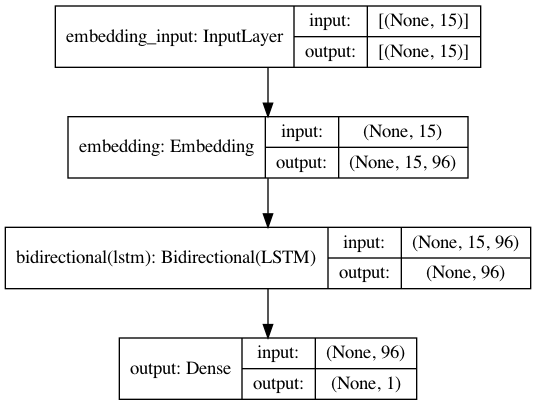

In [62]:
plot_model(models[0], show_shapes=True)

In [63]:
## Retrieve the summary of results from the tuner
tuner.results_summary()

Results summary
Results in my_dir/untitled_project
Showing 10 best trials
Objective(name='val_accuracy', direction='max')
Trial summary
Hyperparameters:
output_dim: 96
units: 48
Score: 0.6266719102859497
Trial summary
Hyperparameters:
output_dim: 96
units: 64
Score: 0.6262785196304321
Trial summary
Hyperparameters:
output_dim: 96
units: 32
Score: 0.6258851289749146
Trial summary
Hyperparameters:
output_dim: 96
units: 16
Score: 0.625491738319397
Trial summary
Hyperparameters:
output_dim: 128
units: 16
Score: 0.625491738319397
Trial summary
Hyperparameters:
output_dim: 64
units: 16
Score: 0.625491738319397
Trial summary
Hyperparameters:
output_dim: 32
units: 16
Score: 0.625491738319397
Trial summary
Hyperparameters:
output_dim: 32
units: 48
Score: 0.625491738319397
Trial summary
Hyperparameters:
output_dim: 32
units: 32
Score: 0.625491738319397
Trial summary
Hyperparameters:
output_dim: 64
units: 32
Score: 0.625491738319397


## Explanation

### Train Model with the Tuned Hyperparameters

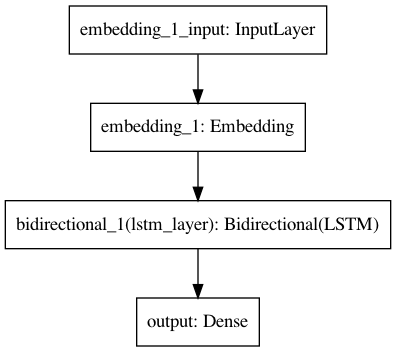

In [64]:
EMBEDDING_DIM = 128
model6 = Sequential()
model6.add(Embedding(input_dim=vocab_size, 
                     output_dim=EMBEDDING_DIM, 
                     input_length=max_len, 
                     mask_zero=True))
model6.add(layers.Bidirectional(LSTM(64, activation="relu", name="lstm_layer", dropout=0.2, recurrent_dropout=0.2)))
model6.add(Dense(1, activation="sigmoid", name="output"))

model6.compile(
    loss=keras.losses.BinaryCrossentropy(),
    optimizer=keras.optimizers.Adam(lr=0.001),
    metrics=["accuracy"]
)
plot_model(model6)

In [65]:
history6 = model6.fit(X_train, y_train, 
                    batch_size=BATCH_SIZE, 
                    epochs=EPOCHS, verbose=2,
                    validation_split = VALIDATION_SPLIT)

Epoch 1/20
40/40 - 7s - loss: 0.6501 - accuracy: 0.6286 - val_loss: 0.6126 - val_accuracy: 0.6302
Epoch 2/20
40/40 - 2s - loss: 0.5519 - accuracy: 0.7087 - val_loss: 0.4853 - val_accuracy: 0.7537
Epoch 3/20
40/40 - 2s - loss: 0.4613 - accuracy: 0.7789 - val_loss: 0.4476 - val_accuracy: 0.7821
Epoch 4/20
40/40 - 2s - loss: 0.4365 - accuracy: 0.7893 - val_loss: 0.4304 - val_accuracy: 0.7994
Epoch 5/20
40/40 - 2s - loss: 0.4269 - accuracy: 0.7986 - val_loss: 0.4269 - val_accuracy: 0.8135
Epoch 6/20
40/40 - 2s - loss: 0.4247 - accuracy: 0.7994 - val_loss: 0.4197 - val_accuracy: 0.8127
Epoch 7/20
40/40 - 2s - loss: 0.4165 - accuracy: 0.8007 - val_loss: 0.4170 - val_accuracy: 0.8127
Epoch 8/20
40/40 - 2s - loss: 0.4112 - accuracy: 0.8063 - val_loss: 0.4175 - val_accuracy: 0.8175
Epoch 9/20
40/40 - 2s - loss: 0.4060 - accuracy: 0.8086 - val_loss: 0.4171 - val_accuracy: 0.8096
Epoch 10/20
40/40 - 2s - loss: 0.4049 - accuracy: 0.8088 - val_loss: 0.4170 - val_accuracy: 0.8143
Epoch 11/20
40/40 -

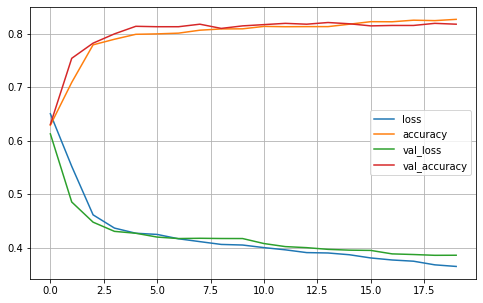

In [66]:
plot2(history6)

In [67]:
from lime.lime_text import LimeTextExplainer

explainer = LimeTextExplainer(class_names=['male'], char_level=True)

In [68]:
def model_predict_pipeline(text):
    _seq = tokenizer.texts_to_sequences(text)
    _seq_pad = keras.preprocessing.sequence.pad_sequences(_seq, maxlen=max_len)
    #return np.array([[float(1-x), float(x)] for x in model.predict(np.array(_seq_pad))])
    return model6.predict(np.array(_seq_pad))



# np.array(sequence.pad_sequences(
#     tokenizer.texts_to_sequences([n for (n,l) in test_set]),
#     maxlen = max_len)).astype('float32')

In [69]:
reversed_word_index = dict([(index, word) for (word, index) in tokenizer.word_index.items()])

In [70]:
text_id =305

In [71]:
X_test[text_id]

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7, 10,  2,  6,  6],
      dtype=int32)

In [72]:
X_test_texts[text_id]

'Odell'

In [73]:
' '.join([reversed_word_index.get(i, '?') for i in X_test[text_id]])

'? ? ? ? ? ? ? ? ? ? o d e l l'

In [74]:
model_predict_pipeline([X_test_texts[text_id]])

array([[0.5448343]], dtype=float32)

In [75]:
exp = explainer.explain_instance(
X_test_texts[text_id], model_predict_pipeline, num_features=100, top_labels=1)

In [76]:
exp.show_in_notebook(text=True)

In [77]:
y_test[text_id]

1

In [78]:
exp = explainer.explain_instance(
'Tim', model_predict_pipeline, num_features=100, top_labels=1)
exp.show_in_notebook(text=True)

In [79]:
exp = explainer.explain_instance(
'Michaelis', model_predict_pipeline, num_features=100, top_labels=1)
exp.show_in_notebook(text=True)

In [80]:
exp = explainer.explain_instance(
'Sidney', model_predict_pipeline, num_features=100, top_labels=1)
exp.show_in_notebook(text=True)

In [81]:
exp = explainer.explain_instance(
'Timber', model_predict_pipeline, num_features=100, top_labels=1)
exp.show_in_notebook(text=True)

In [82]:
exp = explainer.explain_instance(
'Alvin', model_predict_pipeline, num_features=100, top_labels=1)
exp.show_in_notebook(text=True)

## References

- Chollet (2017), Ch 3 and  Ch 4